# Task 4 : Location-based Analysis

<h3>Objective :</h3>

- Perform a geographical analysis of the restaurants in the dataset.

<h3>Steps :</h3>

- Explore the latitude and longitude coordinates of the restaurants and visualize their distribution on a map.
- Group the restaurants by city or locality and analyze the concentration of restaurants in different areas.
- Calculate statistics such as the average ratings, cuisines, or price ranges by city or locality.
- Identify any interesting insights or patterns related to the locations of the restaurants.

## Import necessary Libraries and Data Loading

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px

import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap


# Ignore warnings

import warnings
warnings.filterwarnings('ignore') 

In [2]:
# Data Loading (CSV file)

dataset = pd.read_csv(r"E:\Cognify\Dataset .csv")
dataset.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## Data Pre-processing

<h3>Missing Value Data Analysis</h3>

In [3]:
# Check columns of the dataframe

print(list(dataset.columns))

['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Aggregate rating', 'Rating color', 'Rating text', 'Votes']


In [4]:
# Check null count and data types

dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [5]:
# Handle Missing Values
dataset.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

    - In this dataset, 9 values ​​of the Cuisines were empty, which was removed.

In [6]:
# Drop rows where 'Cuisines' is missing and restore in new dataframe

refine_data = dataset.dropna()
refine_data.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [7]:
# Check for duplicates

refine_data.duplicated().sum()

0

In [8]:
# Validate Co-ordinates

refine_data = refine_data[(refine_data['Latitude'].between(-90, 90)) & (refine_data['Longitude'].between(-180, 180))]

In [9]:
# Reset Index after clean up

refine_data.reset_index(drop=True, inplace=True)

In [10]:
# Verify process data

refine_data.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## EDA - Exploratory Data Analysis

<h3>Statistical Data Analysis and Visual Data Analysis</h3>

In [11]:
# Descriptive Statistics

refine_data.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


<h3>Conclusion of Descriptive Statistics</h3>

1. Average Cost for Two : 
- There's a high variance in average cost, a mix of both budget and luxury restaurants. 
- The extreme max value of two 800,000$ could be an outlier.

2. Price Range :
- Price range scale 1 to 4
- Most frequent either 1 or 2
- Most restaurants fall between low to mid-range pricing with few high-end options.

3. Aggregate Rating :
- The average rating is below 3, suggesting that many restaurants have moderate to poor ratings.
- The presence of ratings indicates mixed customer rating.

4. Votes : 
- Most restaurants have low customer review counts, but a few have high popularity (10,934 votes). 
- The high standard deviation suggests some restaurants get significantly more attention than others.

In [12]:
# Check Unique values

unique_dict = dict()
unique_count = dict()

# create a for loop to store unique values in dictionary
for i in list(refine_data.columns):
    unique_dict.update({i : refine_data[i].unique()})
    unique_count.update({i : len(refine_data[i].unique())})

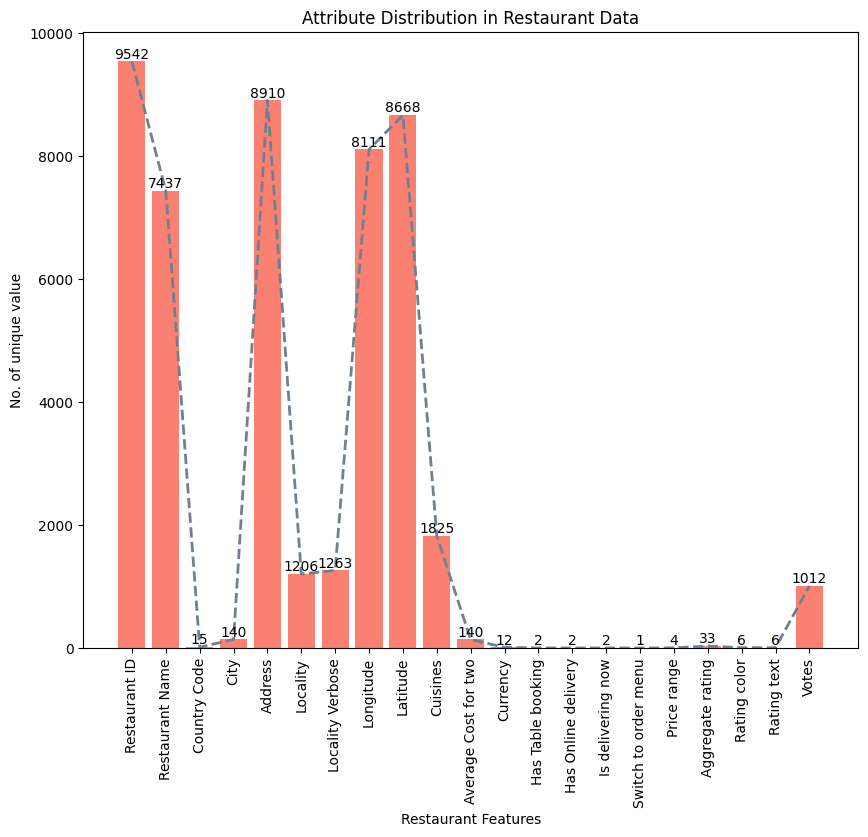

In [13]:
# Unique Value Counts Visual Analysis

plt.figure(figsize=(10,8))
plt.title(f"Attribute Distribution in Restaurant Data")
ax = plt.bar(unique_count.keys(), unique_count.values(), color = 'salmon')
plt.bar_label(ax,labels=unique_count.values())
plt.plot(list(unique_count.keys()), list(unique_count.values()), color = 'slategray', linestyle='dashed', linewidth=2)
plt.xticks(rotation=90)
plt.xlabel("Restaurant Features")
plt.ylabel("No. of unique value")
plt.show()

<h3>Graph Analysis Summary</h3>

- This bar chart visualizes the number of unique values for each feature in the restaurant dataset.

    - Restaurants span 15 different countries and cities with varity of cuisines.
    - Each restaurant has a unique identifier but some duplicates or chains.
    - Table Booking, Online Delivery indicate limited choices

## Graphical analysis

#### Geographical Map visualization

In [14]:
# Create map centered on median coordinates

center_lat = refine_data['Latitude'].median()
center_long = refine_data['Longitude'].median()
restaurant_map = folium.Map(location=[center_lat, center_long], zoom_start=11)

# Add clustered markers
marker_cluster = MarkerCluster().add_to(restaurant_map)
for _, row in refine_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} ({row['City']})",
        tooltip=row['Cuisines']
    ).add_to(marker_cluster)
    

print("\nNumber of the Resturant on the location \n\n")
restaurant_map


Number of the Resturant on the location 




In [15]:
fig = px.scatter_mapbox(refine_data, lat='Latitude', lon='Longitude', zoom = 0.5)
fig.update_layout(mapbox_style='carto-darkmatter', height = 500 , width = 800 , title = 'Location of the Resturants' , title_x = 0.5)
fig.show()

In [16]:
print("Cluster Heatmap of the Resturant location \n\n")

map = folium.Map(location=[refine_data['Latitude'].mean(), refine_data['Longitude'].mean()], zoom_start=2 , height = '100%' , width = '100%')

heat_data = [[row['Latitude'], row['Longitude']] for index, row in refine_data.iterrows()]
HeatMap(heat_data, radius=15).add_to(map)
map

Cluster Heatmap of the Resturant location 




<h3>Geographical Map Conclusion</h3>

- The cities with the highest restaurant density are likely major urban centers (like Makati, Mandaluyong, etc.)

- Most common cuisines in these cities include Japanese, Asian, and Fast Food.
- Areas with higher average ratings tend to have slightly higher price ranges.
- A high concentration of restaurants is seen around shopping areas and malls.

#### Statistical and Visual Analysis of Cuisines

In [17]:
# Standardize Cuisines Column

refine_data['Cuisines']= refine_data['Cuisines'].str.replace(" ", "")

In [18]:
# The most common cuisine type

cuisine_data = pd.Series(refine_data['Cuisines'].str.split(",").explode() , name= 'Cuisines')

print(f"\n📊 The most common cuisine type\n")

top_cuisine = cuisine_data.value_counts().reset_index()
top_cuisine.head(10)


📊 The most common cuisine type



,Cuisines,count
0,NorthIndian,3960
1,Chinese,2735
2,FastFood,1986
3,Mughlai,995
4,Italian,764
5,Bakery,745
6,Continental,736
7,Cafe,703
8,Desserts,653
9,SouthIndian,636


- North Indian cuisine is the most dominant, followed by Chinese and Fast Food which are also highly popular.

In [19]:
# reset index
cuisine_data = cuisine_data.reset_index()

In [20]:
# cuisines served by restaurant

percentages = []

# Calculate percentages of each cuisine

for cuisine in list(top_cuisine['Cuisines'].head(10)):
    cuisine_subset = cuisine_data.loc[cuisine_data['Cuisines'] == cuisine, :]
    percentage = round(cuisine_subset['index'].count() / cuisine_data['index'].count() * 100, 3)
    print(f"{percentage} % {cuisine} food is served by restaurants.")
    percentages.append({'Cuisine': cuisine, 'Percentage': percentage})

20.091 % NorthIndian food is served by restaurants.
13.876 % Chinese food is served by restaurants.
10.076 % FastFood food is served by restaurants.
5.048 % Mughlai food is served by restaurants.
3.876 % Italian food is served by restaurants.
3.78 % Bakery food is served by restaurants.
3.734 % Continental food is served by restaurants.
3.567 % Cafe food is served by restaurants.
3.313 % Desserts food is served by restaurants.
3.227 % SouthIndian food is served by restaurants.


- North Indian cuisine is the most widely served and, Chinese and Fast Food cuisines are also highly popular served by Restaurants.

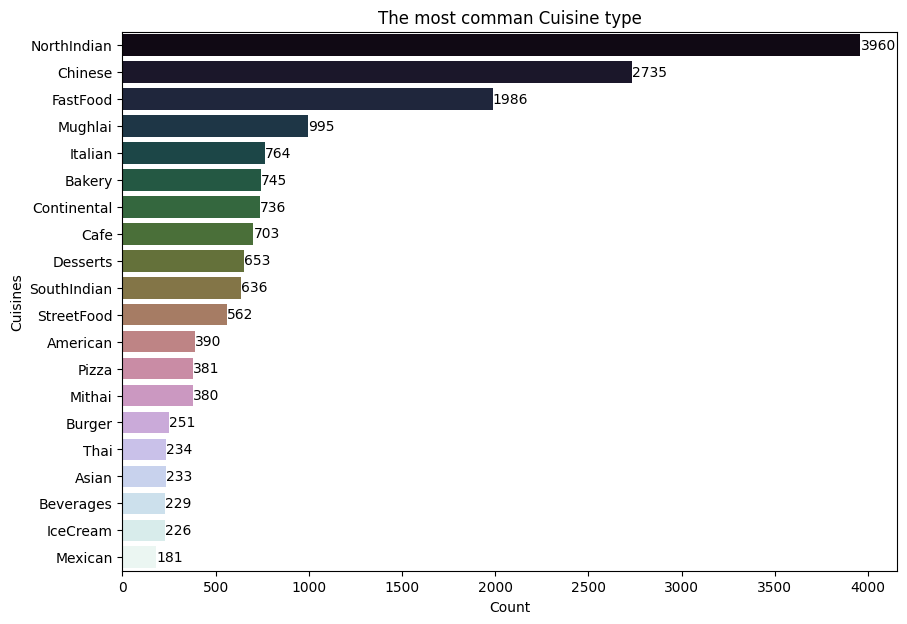

In [21]:
top_cuisine = top_cuisine.head(20)

# Plotting

plt.figure(figsize=(10, 7))
ax = sns.barplot(data = top_cuisine, x='count', y= 'Cuisines', palette='cubehelix')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Count")
plt.ylabel("Cuisines")
plt.title("The most comman Cuisine type")
plt.show()

In [22]:
# high rating cuisines trend more than 3 average rating

avg_rat = refine_data.groupby('Cuisines')['Aggregate rating'].mean().reset_index().rename(columns = {'Aggregate rating' : 'Aggregate rating'})

print(f"\n📊 High rated Cuisines which is more than 3 rating \n")

avgrat = avg_rat.loc[avg_rat['Aggregate rating'] > 3 , : ]
avgrat.head(10)


📊 High rated Cuisines which is more than 3 rating 



,Cuisines,Aggregate rating
4,African,4.700000
5,"African,Portuguese",4.200000
6,American,3.667742
7,"American,Asian,Burger",4.600000
8,"American,Asian,European,Seafood",4.600000
9,"American,Asian,Italian,Seafood",4.500000
10,"American,Asian,NorthIndian,Mexican,SouthIndian",3.300000
11,"American,BBQ",3.800000
12,"American,BBQ,Burger",3.850000
13,"American,BBQ,Sandwich",4.900000


In [23]:
avg_rat.sort_values('Aggregate rating', ascending=False).head(10)

,Cuisines,Aggregate rating
1062,"Italian,Deli",4.9
13,"American,BBQ,Sandwich",4.9
41,"American,CoffeeandTea",4.9
169,"BBQ,Breakfast,Southern",4.9
33,"American,Burger,Grill",4.9
808,"European,German",4.9
1286,"Mughlai,Lucknowi",4.9
803,"European,Contemporary",4.9
796,"European,Asian,Indian",4.9
1214,"Mexican,American,HealthyFood",4.9


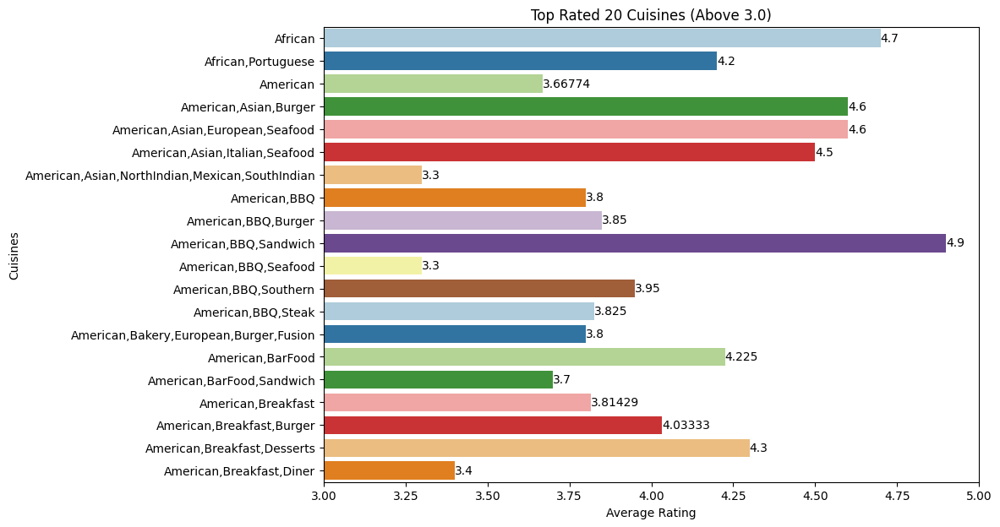

In [24]:
avgrat_df = avgrat.head(20)

# Plotting

plt.figure(figsize=(10, 7))
ax = sns.barplot(x=avgrat_df['Aggregate rating'], y=avgrat_df['Cuisines'], palette='Paired')
for container in ax.containers:
    ax.bar_label(container)
plt.xlabel("Average Rating")
plt.ylabel("Cuisines")
plt.title("Top Rated 20 Cuisines (Above 3.0)")
plt.xlim(3, 5) # Ratings are between 3 and 5
plt.show()

<h3> Conclusion</h3>

- To identify cuisines with an average rating above 3.0, indicating their popularity and customer satisfaction.

- A total of 1,406 cuisines have an average rating above 3.0.
- 19 Cuisine stands out with an exceptionally high rating 4.9.

#### Statistical and Visual Analysis of City

In [25]:
# highest number of restaurant

city_stats = refine_data.groupby('City').agg({
    'Aggregate rating': 'mean',
    'Price range': 'mean',
    'Restaurant ID': 'count'
}).rename(columns={'Restaurant ID': 'Restaurant Count'}).sort_values(by='Restaurant Count', ascending=False)

# Display stats
print("\n📊 Top 5 Cities with the most Restaurants\n")

city_stats.head(5).round(3)


📊 Top 5 Cities with the most Restaurants



,Aggregate rating,Price range,Restaurant Count
City,,,
New Delhi,2.439,1.622,5473
Gurgaon,2.651,1.856,1118
Noida,2.036,1.602,1080
Faridabad,1.867,1.454,251
Ghaziabad,2.852,1.800,25


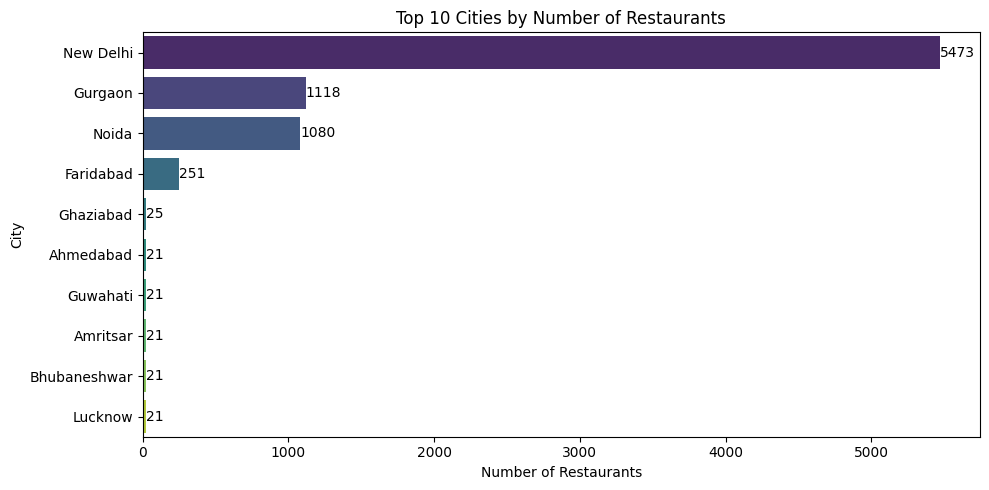

In [26]:
city_counts = refine_data['City'].value_counts().head(10)

# Plot top cities
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=city_counts.values, y=city_counts.index, palette='viridis')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.tight_layout()
plt.show()

<h3>Conclusion</h3>

- New Delhi with the highest number of restaurant - 5473 but it's create a huge difference with other city.

In [27]:
# Highest Aggregate Rating

city_stat = refine_data.groupby('City').agg({
    'Aggregate rating': 'mean',
    'Price range': 'mean',
    'Restaurant ID': 'count'
}).rename(columns={'Aggregate rating': 'Aggregate rating', 'Restaurant ID' : 'Restaurant Count'}).sort_values(by='Aggregate rating', ascending=False)

# Display stats
print("\n📊 Top 5 Cities with the most Aggregate rating\n")
city_stat.head(5).round(3)


📊 Top 5 Cities with the most Aggregate rating



,Aggregate rating,Price range,Restaurant Count
City,,,
Inner City,4.900,4.00,2
Quezon City,4.800,3.00,1
Makati City,4.650,3.00,2
Pasig City,4.633,3.00,3
Mandaluyong City,4.625,3.75,4


In [28]:
# pie chart of price range
fig = px.pie(data_frame= refine_data['Price range'].value_counts().reset_index() , values= 'count' , labels= 'Price range' ,
             hover_name= 'Price range' , title= "Analyzing Price range percentage", names= "Price range" )
fig.update_layout(title_x = 0.5 , height = 450 , showlegend = True , width = 700 , legend=dict(title='Price Range'))
fig.show()
plt.show()

<h3>Conclusion</h3>

- In the dataset, price range represented as a numerical column (1, 2, 3, 4) based on the "Average Cost for Two" column.

- For example, 
    
    1. 0 - 10$
    2. 11 - 39$
    3. 40 - 1200$
    4. 1200$ <

- Low (Budget-Friendly) – Affordable restaurants with lower meal costs is the highest counts.

In [29]:
# MOST COMMON CUISINES PER CITY 

refine_data['Cuisine List'] = refine_data['Cuisines'].str.split(',')

cuisine_explode = refine_data[['City', 'Cuisine List']].explode('Cuisine List')
top_cuisines_per_city = cuisine_explode.groupby(['City', 'Cuisine List']).size().reset_index(name='Count')
top_cuisines = top_cuisines_per_city.sort_values(['City', 'Count'], ascending=[True, False]).groupby('City').head(1)

print("\n🍽️ Most Popular Cuisine in Top Cities:\n")
top_cuisines.head(10)


🍽️ Most Popular Cuisine in Top Cities:



,City,Cuisine List,Count
11,Abu Dhabi,Indian,7
37,Agra,NorthIndian,15
48,Ahmedabad,Continental,12
62,Albany,American,4
91,Allahabad,NorthIndian,12
104,Amritsar,NorthIndian,15
113,Ankara,Kebab,10
120,Armidale,BarFood,1
122,Athens,American,5
145,Auckland,Cafe,5


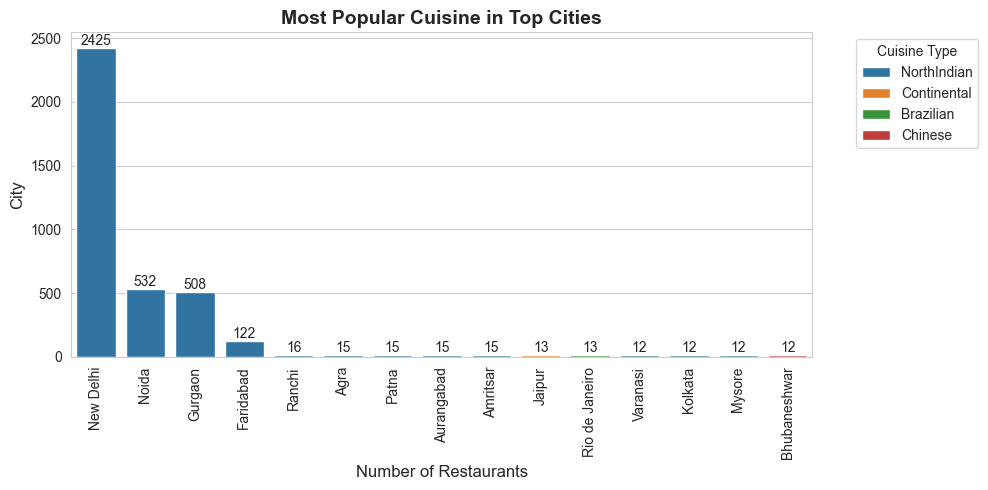

In [30]:
sns.set_style("whitegrid")

# Sort by count for better visualization
top_cuisines = top_cuisines.sort_values(by="Count", ascending=False).head(15)

# Plot
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=top_cuisines["City"], y=top_cuisines["Count"], hue=top_cuisines["Cuisine List"].head(15), palette="tab10")
for container in ax.containers:
    ax.bar_label(container)
plt.title("Most Popular Cuisine in Top Cities", fontsize=14, fontweight="bold")
plt.xlabel("Number of Restaurants", fontsize=12)
plt.ylabel("City", fontsize=12)
plt.legend(title="Cuisine Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

In [31]:
# highest average price range

top_cities = refine_data.groupby('City')['Price range'].mean().nlargest(20).reset_index()
top_cities.head(10)

,City,Price range
0,Inner City,4.000000
1,Johannesburg,4.000000
2,Panchkula,4.000000
3,Pasay City,4.000000
4,Paynesville,4.000000
5,Princeton,4.000000
6,Vineland Station,4.000000
7,Sandton,3.818182
8,Mandaluyong City,3.750000
9,Pretoria,3.700000


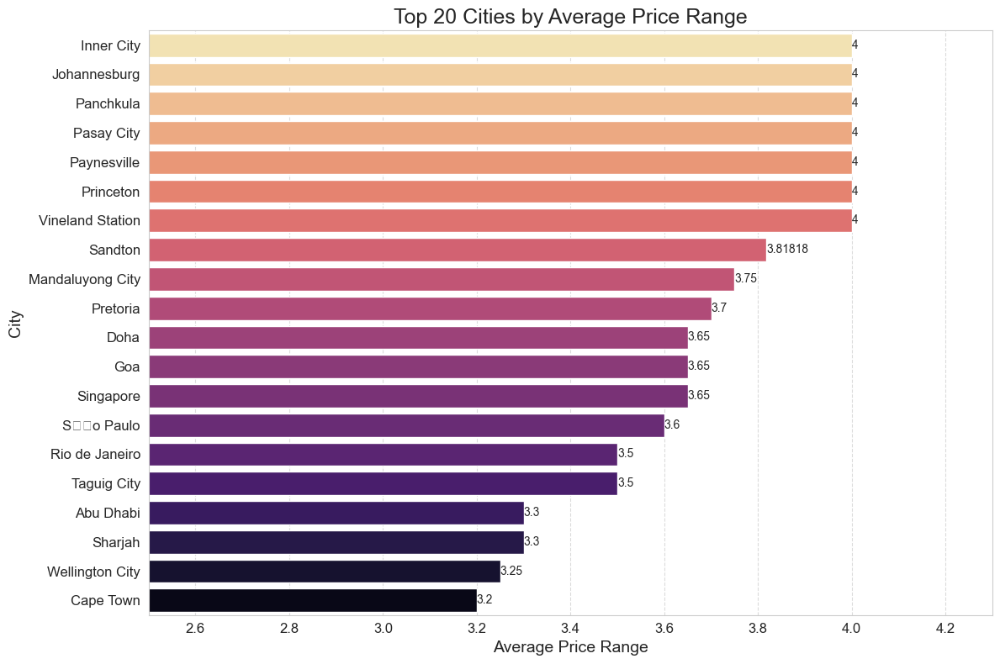

In [32]:
# Sort the DataFrame by cost
top_cities = top_cities.sort_values('Price range')

# Plot the data as a horizontal bar chart
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=top_cities['Price range'], y=top_cities['City'], palette="magma")
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top {} Cities by Average Price Range'.format(20), fontsize=18)
plt.xlabel('Average Price Range', fontsize=14)
plt.ylabel('City', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.xlim(2.5, 4.3)
plt.show()

#### Statistical and Visual Analysis of Locality

In [33]:
locality_counts = refine_data['Locality'].value_counts().head(10)
locality_counts.head(10)

Locality
Connaught Place        122
Rajouri Garden          99
Shahdara                87
Defence Colony          86
Pitampura               85
Malviya Nagar           85
Mayur Vihar Phase 1     84
Rajinder Nagar          81
Safdarjung              80
Satyaniketan            79
Name: count, dtype: int64

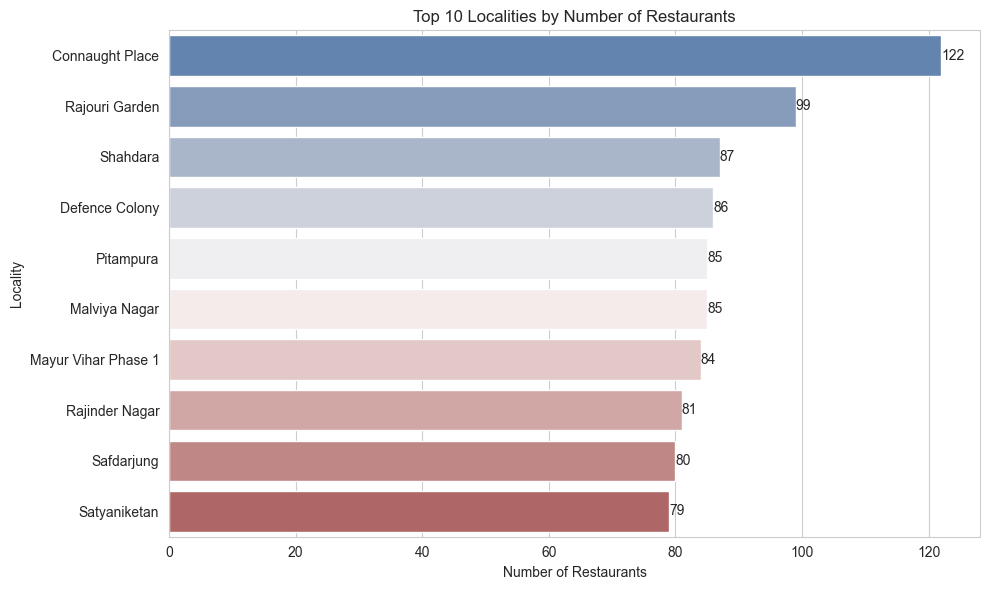

In [34]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=locality_counts.values, y=locality_counts.index, palette='vlag')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top 10 Localities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.tight_layout()
plt.show()

<h3>Conclusion</h3>

- These areas are prime spots for restaurants due to high foot traffic, strong demand, good connectivity, and target demographics.

#### Statistical and Visual Analysis of Restaurat rating

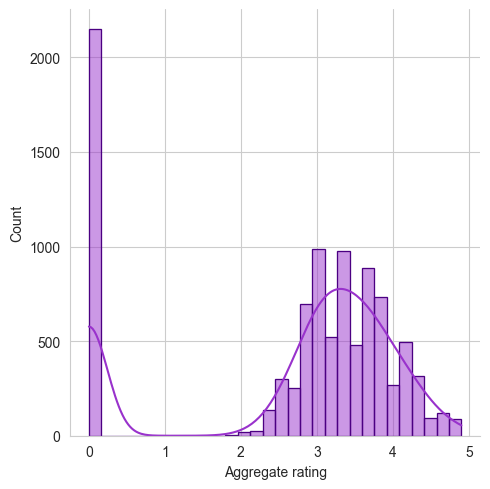

In [35]:
# Distribution of Rating

sns.displot(refine_data['Aggregate rating'], kde=True, bins=30, ec = 'indigo', color = 'darkorchid', )
plt.show()

<h3>Conclusion</h3>

- The histogram shows a bimodal distribution of restaurant ratings.

- A significant number of restaurants have a rating of zero. Among rated restaurants, the distribution is right-skewed, with most ratings clustering between 2.5 and 4.5 indicating that average restaurants dominate the market. 
- Few restaurants achieve extremely high or low ratings.

In [36]:
# highest restaurant rating

high_rate = refine_data.groupby("Restaurant Name")["Votes"].mean().nlargest(20).reset_index()
high_rate.head(10)

,Restaurant Name,Votes
0,Toit,10934.0
1,Hauz Khas Social,7931.0
2,Peter Cat,7574.0
3,Big Brewsky,5705.0
4,The Black Pearl,5385.0
5,BarBQ,5288.0
6,Warehouse Cafe,4914.0
7,Truffles,4841.0
8,Mocambo,4464.0
9,Gulati,4373.0


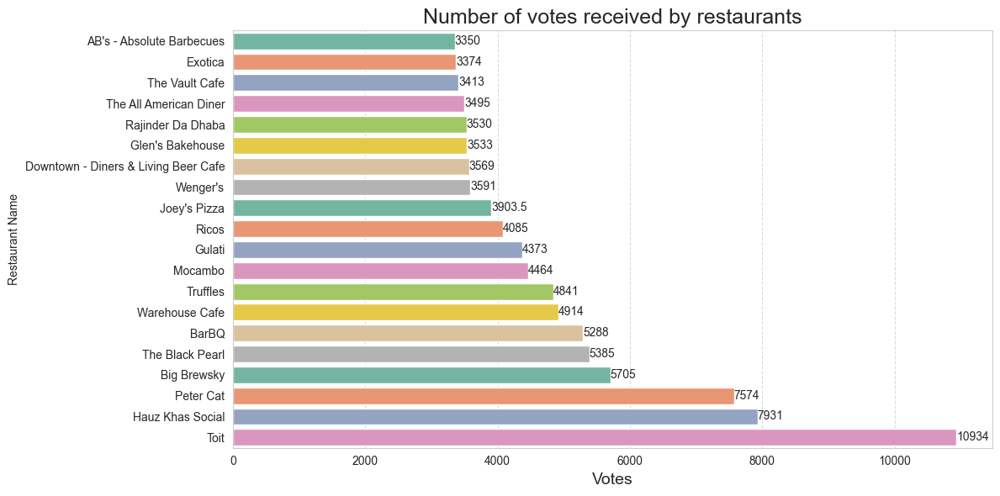

In [37]:
high_rate = high_rate.sort_values('Votes')

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=high_rate['Votes'], y=high_rate['Restaurant Name'], palette='Set2')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Number of votes received by restaurants', fontsize=18)
plt.xlabel('Votes', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

#### Statistical and Visual Analysis of Restaurat Chains

In [38]:
rest_no = refine_data['Restaurant Name'].value_counts().reset_index()

for i in range(1,5): 
    
    chain_count = rest_no.loc[rest_no['count']> i , : ]
    print(f"There are a total of {chain_count['Restaurant Name'].nunique()} restaurants which have their {i} or more own chains.")

There are a total of 734 restaurants which have their 1 or more own chains.
There are a total of 266 restaurants which have their 2 or more own chains.
There are a total of 158 restaurants which have their 3 or more own chains.
There are a total of 112 restaurants which have their 4 or more own chains.


In [39]:
print('\nTop 10 restauranst chain by the number of outlets\n')

rest_chain = chain_count.sort_values('count' , ascending=False).head(10).rename(columns={'Retaurant Name' : 'Restaurant Chains', 'count': 'No of Outlets'})
rest_chain.head(10)


Top 10 restauranst chain by the number of outlets



,Restaurant Name,No of Outlets
0,Cafe Coffee Day,83
1,Domino's Pizza,79
2,Subway,63
3,Green Chick Chop,51
4,McDonald's,48
5,Keventers,34
6,Pizza Hut,30
7,Giani,29
8,Baskin Robbins,28
9,Barbeque Nation,26


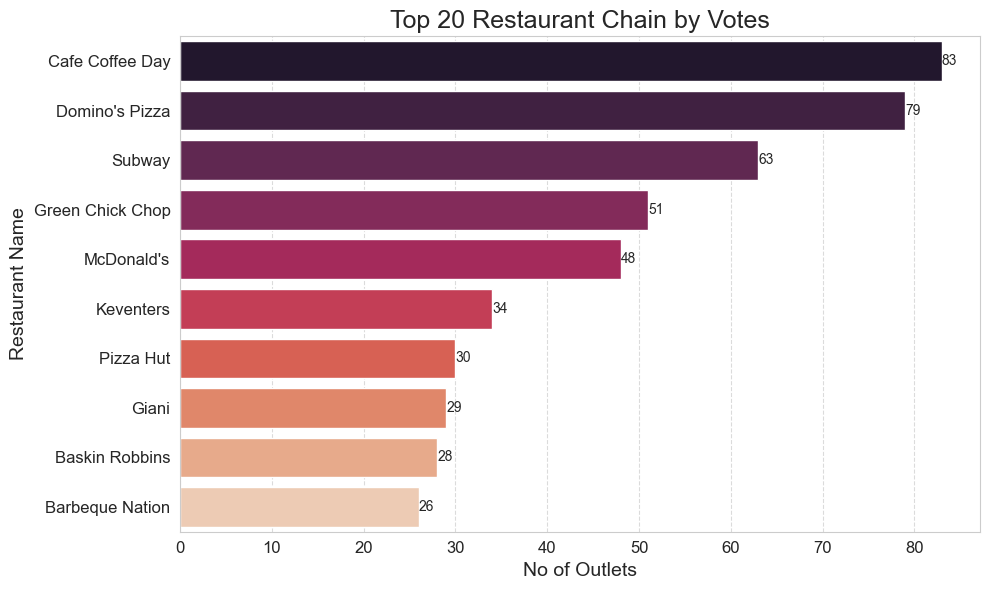

In [40]:
# Sort the DataFrame
rest_chain = rest_chain.sort_values('No of Outlets')


# Plot the data as a horizontal bar chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=rest_chain['No of Outlets'], y=rest_chain['Restaurant Name'], palette="rocket_r")
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top {} Restaurant Chain by Votes'.format(20), fontsize=18)
plt.xlabel('No of Outlets', fontsize=14)
plt.ylabel('Restaurant Name', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

<h3>Conclusion</h3>

- The data reveals that Cafe Coffee Day has the largest presence among restaurant chains, followed by Domino's Pizza and Subway. 

In [41]:
chain_group = refine_data.loc[refine_data['Restaurant Name'].isin(chain_count['Restaurant Name'].tolist()), : ].groupby('Restaurant Name').agg({'Aggregate rating': 'mean', 'Votes': 'sum'}).reset_index()

print('\nTop 10 Restaurant Chains by the Highest Rating\n')

rate_chain = chain_group[['Restaurant Name' , 'Aggregate rating']].sort_values('Aggregate rating' , ascending = False).head(10).rename(columns = {'Restaurant Name' : 'Restaurant Chain'})
rate_chain.head(10)


Top 10 Restaurant Chains by the Highest Rating



,Restaurant Chain,Aggregate rating
26,Chili's,4.580000
38,Farzi Cafe,4.366667
8,Barbeque Nation,4.353846
77,Punjab Grill,4.340000
62,Mocha,4.185714
98,Texas Roadhouse,3.860000
47,Happy Hakka,3.860000
97,TGI Friday's,3.850000
57,L'Opera,3.820000
94,Starbucks,3.805556


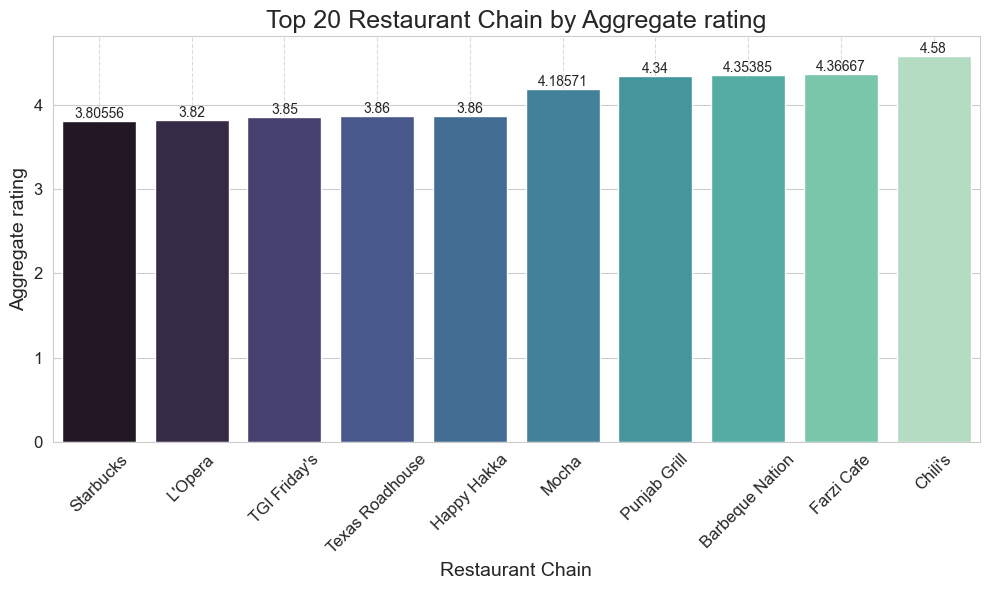

In [42]:
# Sort the DataFrame
rate_chain = rate_chain.sort_values('Aggregate rating')


# Plot the data as a horizontal bar chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=rate_chain['Restaurant Chain'], y=rate_chain['Aggregate rating'], palette="mako")
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top {} Restaurant Chain by Aggregate rating'.format(20), fontsize=18)
plt.xlabel('Restaurant Chain', fontsize=14)
plt.ylabel('Aggregate rating', fontsize=14)
plt.xticks(fontsize=12, rotation = 45)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
# plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [43]:
print('\nTop 10 Restaurant Chains popularity by votes\n')

popular_chain = chain_group[['Restaurant Name' , 'Votes']].sort_values('Votes' , ascending = False).head(10).rename(columns = {'Restaurant Name' : 'Restaurant Chains'})
popular_chain.head(10)


Top 10 Restaurant Chains popularity by votes



,Restaurant Chains,Votes
8,Barbeque Nation,28142
38,Farzi Cafe,10098
26,Chili's,8156
94,Starbucks,7139
51,Karim's,6878
35,Domino's Pizza,6643
95,Subway,6124
36,Dunkin' Donuts,5974
72,Pind Balluchi,5582
77,Punjab Grill,5424


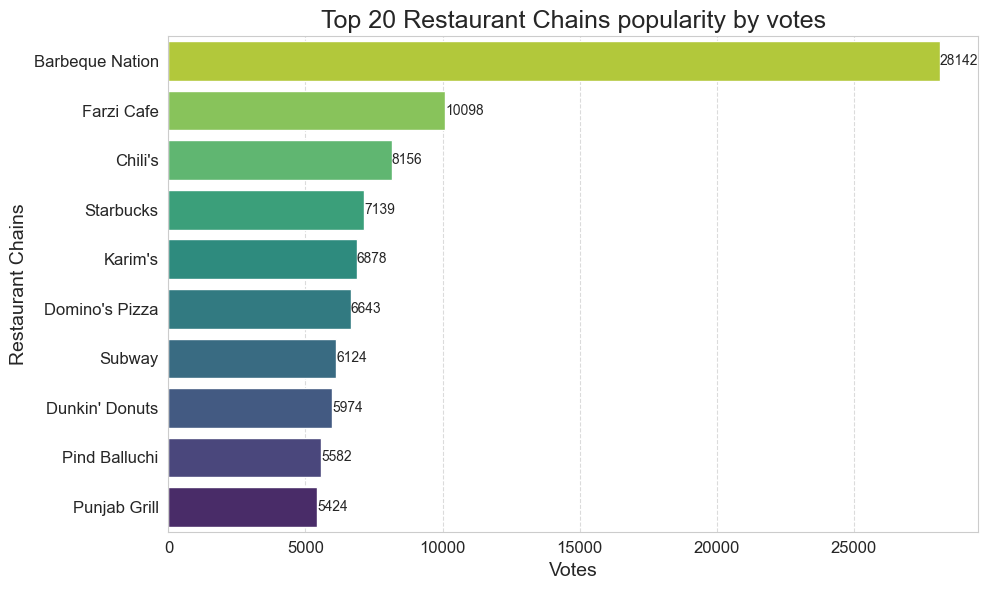

In [44]:
# Sort the DataFrame
popular_chain = popular_chain.sort_values('Votes')

# Plot the data as a horizontal bar chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=popular_chain['Votes'], y=popular_chain['Restaurant Chains'], palette="viridis")
for container in ax.containers:
    ax.bar_label(container)
plt.title('Top {} Restaurant Chains popularity by votes'.format(20), fontsize=18)
plt.xlabel('Votes', fontsize=14)
plt.ylabel('Restaurant Chains', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

#### Statistical and Visual Analysis of Votes

In [45]:
print('\nRestaurant with the highest number of votes :' , 
refine_data.loc[refine_data['Votes'] == refine_data['Votes'].max() , 'Restaurant Name'].tolist()[-1])

print('\nRestaurant with the lowest number of votes : ' , 
refine_data.loc[refine_data['Votes'] == refine_data['Votes'].min() , 'Restaurant Name'].tolist()[-1])


Restaurant with the highest number of votes : Toit

Restaurant with the lowest number of votes :  Platters


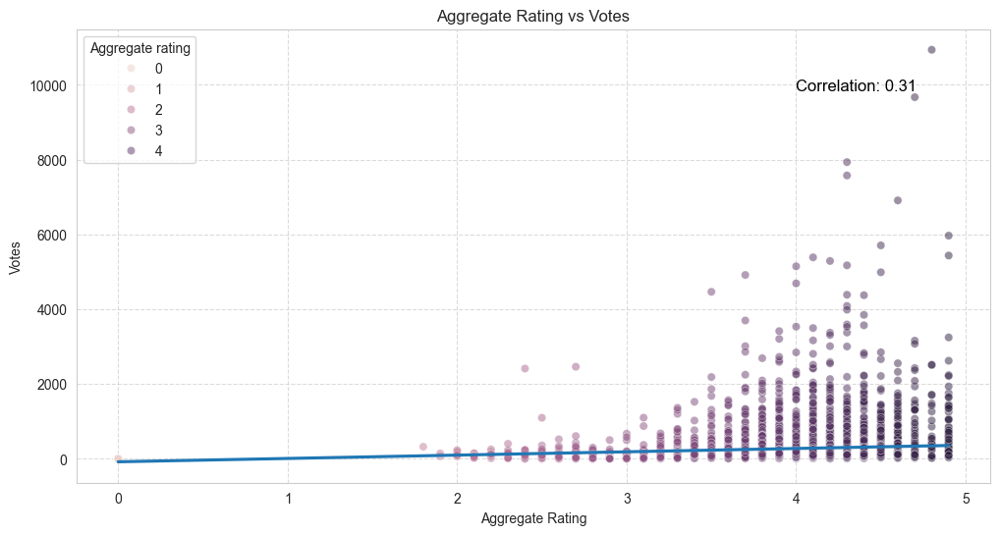

In [46]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=refine_data["Aggregate rating"], y=refine_data["Votes"],hue = refine_data['Aggregate rating'], alpha=0.5)
sns.regplot(x=refine_data['Aggregate rating'], y=refine_data['Votes'], scatter=False)

# Calculate and display the correlation coefficient
correlation = refine_data["Aggregate rating"].corr(refine_data["Votes"])
plt.text(4, max(refine_data["Votes"])*0.9, f"Correlation: {correlation:.2f}", fontsize=12, color="Black")

# Labels and title
plt.xlabel("Aggregate Rating")
plt.ylabel("Votes")
plt.title("Aggregate Rating vs Votes")

# Show the plot
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

<h3>Conclusion</h3>

- The scatter plot shows a positive correlation between aggregate ratings and another variable Votes.

- Although the correlation is moderate, it suggests that higher-rated restaurants tend to have more engagement. 
- However, the wide spread of data points indicates other influential factors beyond just ratings.